In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

![Yelp](https://upload.wikimedia.org/wikipedia/commons/thumb/a/ad/Yelp_Logo.svg/300px-Yelp_Logo.svg.png)

_____________

Есть следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

_____________

**Задачи:**

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами.
* А также найти рестораны с наилучшими отзывами.


#### 1. Город с наибольшим количеством компаний

Загрузим данные из файла `yelp_business.csv`


In [2]:
yelp_bus = pd.read_csv('yelp_business.csv')
yelp_bus.head()

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдем пять городов, по которым присутствует информация о наибольшем количестве компаний.

In [3]:
top_cities = yelp_bus.groupby('city')['business_id'].count().sort_values(ascending=False).head(5)
top_cities

city
Las Vegas     26775
Phoenix       17213
Toronto       17206
Charlotte      8553
Scottsdale     8228
Name: business_id, dtype: int64

Пусть `N` &mdash; город с наибольшим количеством компаний. Оставим в таблице только записи, соответствующие городу `N`. Нанесем все эти компании на график, в котором по оси $x$ отметим долготу, а по оси $y$ &mdash; широту.

In [4]:
N = top_cities.idxmax()
N

'Las Vegas'

In [5]:
yelp_bus = yelp_bus[yelp_bus['city'] == N]
yelp_bus

,Unnamed: 0,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
6,6,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",Summerlin,"""2620 Regatta Dr, Ste 102""",Las Vegas,NV,89128,36.207430,-115.268460,1,Real Estate Services;Real Estate;Home Services...
7,7,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",NaN,"""7240 W Lake Mead Blvd, Ste 4""",Las Vegas,NV,89128,36.197484,-115.249660,1,Shopping;Sporting Goods
26,26,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",Southeast,"""5775 S Eastern, Ste 103""",Las Vegas,NV,89119,36.085051,-115.119421,1,Shopping;Jewelry;Watch Repair;Local Services
41,41,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",Spring Valley,"""7260 Cimarron Rd, Ste 130""",Las Vegas,NV,89113,36.056382,-115.269332,1,Home Services;Lighting Fixtures & Equipment;Lo...
48,48,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",NaN,"""5340 Boulder Hwy""",Las Vegas,NV,89122,36.105196,-115.056880,1,Nurseries & Gardening;Home & Garden;Shopping
...,...,...,...,...,...,...,...,...,...,...,...,...
174539,174539,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",Westside,"""3030 S Jones Blvd, Ste 105""",Las Vegas,NV,89146,36.134355,-115.224462,1,Real Estate Services;Home Services;Property Ma...
174545,174545,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",NaN,"""591 N Eastern Ave, Ste 110""",Las Vegas,NV,89101,36.173589,-115.116779,1,Coffee & Tea;Food
174546,174546,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",Southwest,"""7325 S Rainbow Blvd, Ste 120""",Las Vegas,NV,89139,36.055130,-115.243488,1,Mobile Phone Accessories;Mobile Phones;Electro...
174552,174552,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",Westside,"""3375 S Decatur Blvd, Ste 7""",Las Vegas,NV,89102,36.128780,-115.208990,1,Martial Arts;Sports Wear;Men's Clothing;Sporti...


Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы.

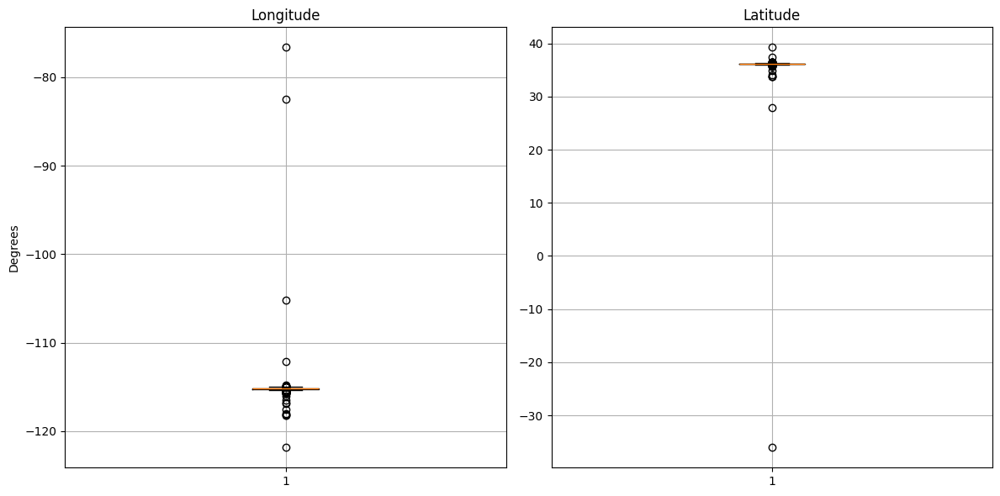

In [6]:
X = yelp_bus['longitude']
Y = yelp_bus['latitude']

plt.figure(figsize=(12, 6))

# Longitude
plt.subplot(1, 2, 1)
plt.boxplot(X)
plt.title('Longitude')
plt.ylabel('Degrees')
plt.grid(True)

# Latitude
plt.subplot(1, 2, 2)
plt.boxplot(Y)
plt.title('Latitude')
plt.grid(True)

plt.tight_layout()
plt.show()


Видим, что в основном компании находятся между -120 и -110 по долготе, и 30 и 40 по широте


In [7]:
yelp_bus = yelp_bus[yelp_bus['longitude'] <= -110]
yelp_bus = yelp_bus[yelp_bus['longitude'] >= -120]
yelp_bus = yelp_bus[yelp_bus['latitude'] >= 30]
yelp_bus = yelp_bus[yelp_bus['latitude'] <= 40]

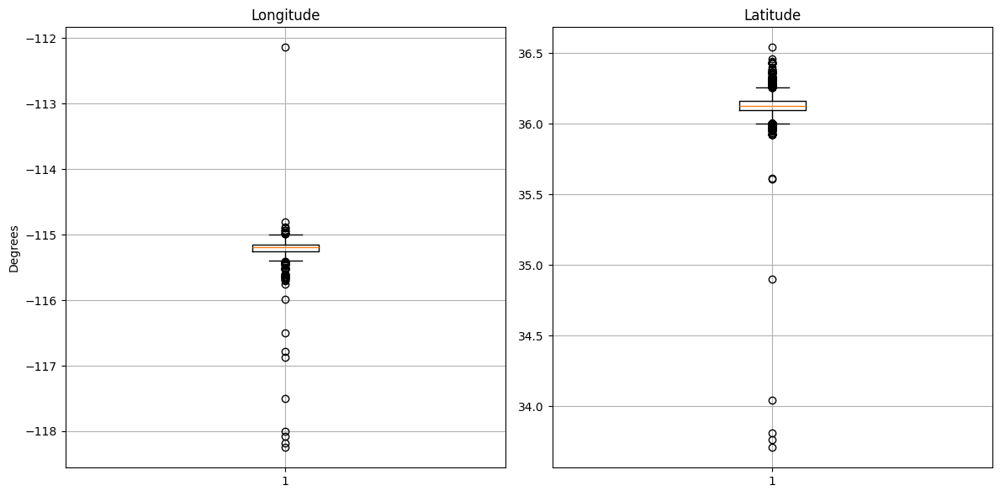

In [8]:
X = yelp_bus['longitude']
Y = yelp_bus['latitude']

plt.figure(figsize=(12, 6))

# Longitude
plt.subplot(1, 2, 1)
plt.boxplot(X)
plt.title('Longitude')
plt.ylabel('Degrees')
plt.grid(True)

# Latitude
plt.subplot(1, 2, 2)
plt.boxplot(Y)
plt.title('Latitude')
plt.grid(True)

plt.tight_layout()
plt.show()


Подгрузим интерактивную карту города в качестве фона графика.

In [9]:
yelp_map = yelp_bus[['longitude', 'latitude']]

In [29]:
import plotly.express as px

fig = px.scatter_map(yelp_map,
                        lat="latitude",
                        lon="longitude",
                        zoom=13,
                        height=500)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

#### 2. Оценки компаний

Посчитаем среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузим таблицу оценок `yelp_review.csv`.

In [11]:
yelp_rev = pd.read_csv('yelp_review.csv')
yelp_rev.head()

,Unnamed: 0,business_id,stars
0,0,AEx2SYEUJmTxVVB18LlCwA,5
1,1,VR6GpWIda3SfvPC-lg9H3w,5
2,2,CKC0-MOWMqoeWf6s-szl8g,5
3,3,ACFtxLv8pGrrxMm6EgjreA,4
4,4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставим только компании города `N`.

In [12]:
yelp_bus['business_id'].head()

6     kCoE3jvEtg6UVz5SOD3GVw
7     OD2hnuuTJI9uotcKycxg1A
26    VBHEsoXQb2AQ76J9l8h1uQ
41    1Jp_hmPNUZArNqzpbm7B0g
48    DPQnTnNw2PJj7DdENM98Cw
Name: business_id, dtype: object

In [13]:
del yelp_rev['Unnamed: 0']
business_ids_N = yelp_bus['business_id']

yelp_rev = yelp_rev.set_index('business_id')

yelp_rev = yelp_rev.loc[yelp_rev.index.intersection(business_ids_N)]

yelp_rev = yelp_rev.reset_index()

yelp_rev.head()

,business_id,stars
0,8QWPlVQ6D-OExqXoaD2Z1g,5
1,8QWPlVQ6D-OExqXoaD2Z1g,4
2,8QWPlVQ6D-OExqXoaD2Z1g,5
3,8QWPlVQ6D-OExqXoaD2Z1g,5
4,8QWPlVQ6D-OExqXoaD2Z1g,5


Посчитаем среднюю оценку каждой компании, а также количество выставленных компании оценок.

In [14]:
company_mean = yelp_rev.groupby('business_id', sort=False).aggregate(['mean', 'size'])
company_mean.head()

stars      
                            mean  size
business_id                           
8QWPlVQ6D-OExqXoaD2Z1g  4.710526    38
pLZ9oZM8c6MNbRlg06lBPg  3.031111   225
6Q7-wkCPc1KF75jZLOTcMw  2.330110  2172
9Jc3W0aR9Xf2gcHI0rEXsw  2.807018    57
xVEtGucSRLk5pxxN0t4i6g  4.049709  1549

In [15]:
company_mean.columns = ['average mark', 'number of reviews']
company_mean.head()

,average mark,number of reviews
business_id,,
8QWPlVQ6D-OExqXoaD2Z1g,4.710526,38
pLZ9oZM8c6MNbRlg06lBPg,3.031111,225
6Q7-wkCPc1KF75jZLOTcMw,2.330110,2172
9Jc3W0aR9Xf2gcHI0rEXsw,2.807018,57
xVEtGucSRLk5pxxN0t4i6g,4.049709,1549


Соедините две полученные ранее таблицы по компаниям города `N` в одну.

In [16]:
company_mean_reset = company_mean.reset_index()
df = yelp_bus[['business_id', 'name', 'latitude', 'longitude', 'categories']]
df = df.merge(company_mean_reset, on='business_id', how='left')
df.head()

,business_id,name,latitude,longitude,categories,average mark,number of reviews
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",36.197484,-115.249660,Shopping;Sporting Goods,1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25


In [17]:
fig = px.scatter_map(
    df,
    lat="latitude",
    lon="longitude",
    color="average mark",
    size_max=10,
    zoom=12,
    opacity=0.3,
    hover_name="name",
    color_continuous_scale="Viridis"
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлим значения широты и долготы, подобрав оптимальный размер района.

In [18]:
df['region_latitude'] = np.round(df['latitude'] * 4, decimals=1) * 0.25
df['region_longitude'] = np.round(df['longitude'] * 4, decimals=1) * 0.25
df.head()

,business_id,name,latitude,longitude,categories,average mark,number of reviews,region_latitude,region_longitude
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,4.000000,5,36.200,-115.275
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",36.197484,-115.249660,Shopping;Sporting Goods,1.444444,9,36.200,-115.250
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23,36.075,-115.125
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20,36.050,-115.275
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25,36.100,-115.050



Для получения средней оценки компаний по району построим сводную таблицу при помощи `pd.pivot_table`

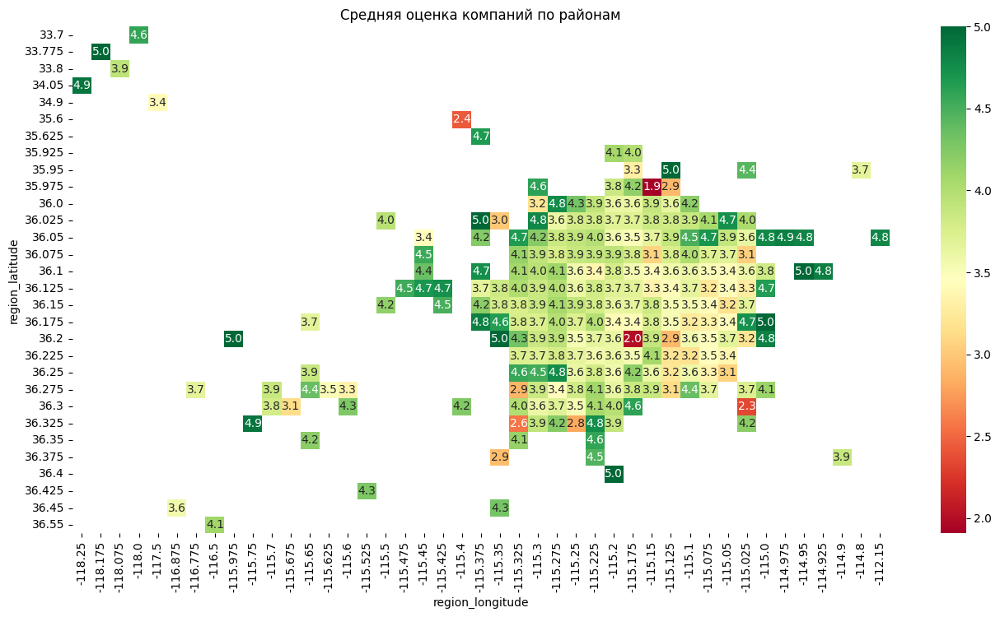

In [19]:
heatmap_data = pd.pivot_table(
    df,
    values="average mark",
    index="region_latitude",
    columns="region_longitude",
    aggfunc="mean"
)

plt.figure(figsize=(16, 8))
fig = sns.heatmap(
    heatmap_data,
    cmap="RdYlGn",
    annot=True,
    fmt=".1f"
)
plt.title("Средняя оценка компаний по районам")
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?
> Если в районе мало компаний, то даже одна высокая или низкая оценка может существенно исказить среднее значение — это делает оценку нестабильной и недостоверной. Кроме того, автоматическая цветовая шкала масштабируется от минимального до максимального значения, и если один район имеет экстремальную оценку, различия между остальными районами будут визуально нивелированы. Это мешает объективной интерпретации результатов и может скрыть важные различия между "средними" районами.

Оставим районы, в которых имеется информация о не менее $30$ компаний.

In [20]:
region_counts = df.groupby(["region_latitude", "region_longitude"]).size().reset_index(name="count")
good_regions = region_counts[region_counts["count"] >= 30][["region_latitude", "region_longitude"]]
new_df = df.merge(good_regions, on=["region_latitude", "region_longitude"], how="inner")

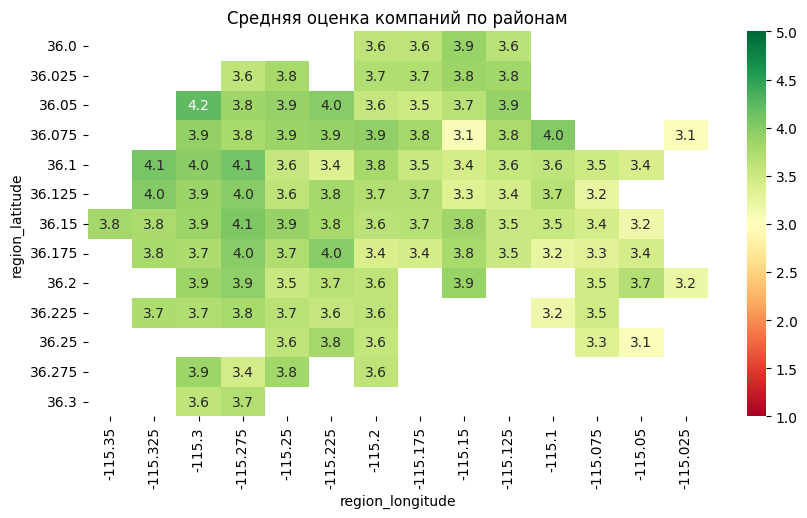

In [21]:
heatmap_data = pd.pivot_table(
    new_df,
    values="average mark",
    index="region_latitude",
    columns="region_longitude",
    aggfunc="mean"
)

plt.figure(figsize=(10, 5))
fig = sns.heatmap(
    heatmap_data,
    vmin=1.0, vmax=5.0,
    cmap="RdYlGn",
    annot=True,
    fmt=".1f"
)
plt.title("Средняя оценка компаний по районам")
plt.show()

**Вывод:** График стал более информативным: мы исключили районы с малым числом компаний, тем самым уменьшив влияние статистических выбросов и нестабильных средних. Кроме того, отмасштабированная цветовая шкала теперь отражает абсолютные оценки, а не относительные. Например, теперь видно, что почти все районы имеют приемлемую среднюю оценку, тогда как ранее районы с чуть более низкими значениями казались "плохими" из-за автоматического масштабирования цвета.

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`.

Составим таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее построим heatmap-график районов, в котором каждому району сопоставим среднюю оценку по ресторанам этого района. Рассмотрим только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

In [22]:
df

,business_id,name,latitude,longitude,categories,average mark,number of reviews,region_latitude,region_longitude
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,4.000000,5,36.200,-115.275
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",36.197484,-115.249660,Shopping;Sporting Goods,1.444444,9,36.200,-115.250
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,4.739130,23,36.075,-115.125
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,4.450000,20,36.050,-115.275
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,3.680000,25,36.100,-115.050
...,...,...,...,...,...,...,...,...,...
26765,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,4.466667,15,36.125,-115.225
26766,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",36.173589,-115.116779,Coffee & Tea;Food,2.400000,35,36.175,-115.125
26767,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,3.857143,35,36.050,-115.250
26768,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...,5.000000,5,36.125,-115.200


In [23]:
restaurants = df[df["categories"].str.contains("restaurant", case=False, na=False)]
restaurants = restaurants[restaurants['number of reviews'] >=5 ]
restaurants

,business_id,name,latitude,longitude,categories,average mark,number of reviews,region_latitude,region_longitude
6,Pd52CjgyEU3Rb8co6QfTPw,"""Flight Deck Bar & Grill""",36.066914,-115.170848,Nightlife;Bars;Barbeque;Sports Bars;American (...,3.769231,13,36.075,-115.175
7,4srfPk1s8nlm1YusyDUbjg,"""Subway""",36.064652,-115.118954,Fast Food;Restaurants;Sandwiches,2.666667,6,36.075,-115.125
8,n7V4cD-KqqE3OXk0irJTyA,"""GameWorks""",36.068259,-115.178877,Arcades;Arts & Entertainment;Gastropubs;Restau...,3.117479,349,36.075,-115.175
19,Wpt0sFHcPtV5MO9He7yMKQ,"""McDonald's""",36.130013,-115.109310,Restaurants;Fast Food;Burgers,2.150000,20,36.125,-115.100
23,W1Yr6c2XDx_RBjb6WsV-aQ,"""Divine Cafe at the Springs Preserve""",36.170706,-115.190288,Restaurants;Cafes;American (New);Bars;Nightlif...,4.050000,140,36.175,-115.200
...,...,...,...,...,...,...,...,...,...
26754,Kbbm6Vd5UdbP10dwjBghRw,"""In-N-Out Burger""",36.040628,-115.191256,Restaurants;Fast Food;Burgers,4.196078,255,36.050,-115.200
26758,UpW3jyJ3_kTG7oDSflwnMA,"""Archi's Thai Kitchen""",36.114816,-115.230970,Restaurants;Thai,3.994695,377,36.125,-115.225
26759,e2ApirIzYID9xIye0r_gKQ,"""Farmer Boys""",36.271006,-115.264392,Salad;Breakfast & Brunch;Sandwiches;Burgers;Re...,2.735955,178,36.275,-115.275
26761,Fv4EXwV30rwGD2NzN1ekgA,"""Gorilla Sushi""",36.100067,-115.127347,Asian Fusion;Restaurants;Japanese;Sushi Bars,4.424490,245,36.100,-115.125


In [24]:
region_counts = restaurants.groupby(["region_latitude", "region_longitude"]).size().reset_index(name="count")
good_regions = region_counts[region_counts["count"] >= 10][["region_latitude", "region_longitude"]]

region_restaurants = restaurants.merge(good_regions, on=["region_latitude", "region_longitude"], how="inner")

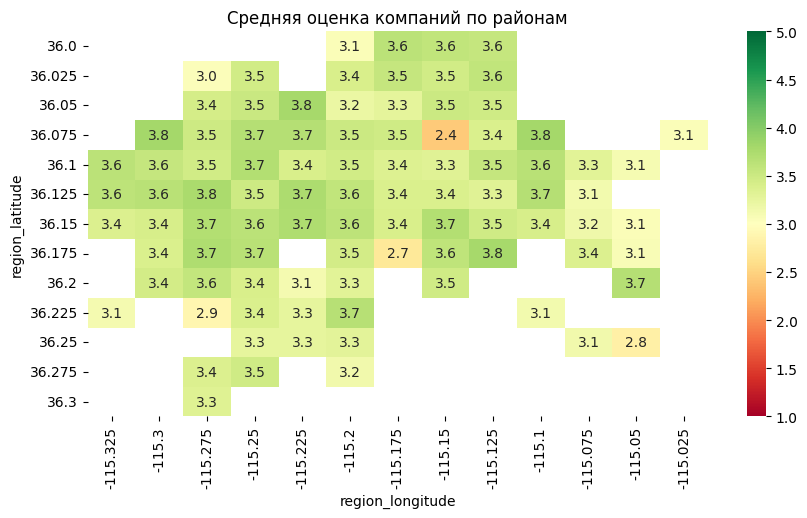

In [25]:
heatmap_data = pd.pivot_table(
    region_restaurants,
    values="average mark",
    index="region_latitude",
    columns="region_longitude",
    aggfunc="mean"
)

plt.figure(figsize=(10, 5))
fig = sns.heatmap(
    heatmap_data,
    vmin=1.0, vmax=5.0,
    cmap="RdYlGn",
    annot=True,
    fmt=".1f"
)
plt.title("Средняя оценка компаний по районам")
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** Это помогает отсеить выбросы, которые могут повлиять на анализ

Олег из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. 
Выведем в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов.

In [26]:
popular_rest = restaurants[restaurants['number of reviews'] >= 50]
popular_rest = popular_rest.sort_values(by='average mark', ascending=False)
best_rests = popular_rest[['name', 'latitude', 'longitude', 'categories', 'average mark', 'number of reviews']].head(10)
best_rests

,name,latitude,longitude,categories,average mark,number of reviews
3614,"""Lip Smacking Foodie Tours""",36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...,4.966480,179
25478,"""Pepito Shack""",36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,4.907692,65
16662,"""Bosa Boba Cafe""",36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,4.890909,55
25802,"""Garden Grill""",36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...,4.868132,91
2138,"""Brew Tea Bar""",36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,4.848069,1165
19007,"""Poppa Naps BBQ""",36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,4.836538,104
12056,"""Zenaida's Cafe""",36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes,4.833333,180
11959,"""El Frescos Cocina Mexicana""",36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...,4.816754,191
5360,"""Blaqcat Ultra Hookah Lounge""",36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...,4.809524,63
25367,"""Smooth Eats""",36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...,4.807018,57


Нанесем на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам.

In [27]:
good_rests = popular_rest[popular_rest['average mark'] >= 4.7]
good_rests = good_rests.iloc[10:]

In [28]:
fig = px.scatter_map(
    good_rests,
    lat="latitude",
    lon="longitude",
    color="average mark",
    size_max=10,
    zoom=10,
    opacity=0.5,
    hover_name="name",
    color_continuous_scale="Viridis"
)

fig.add_scattermapbox(lat=best_rests['latitude'],
                      lon=best_rests['longitude'],
                      mode='markers',
                      marker=dict(color='red', size=7, symbol='circle', opacity=0.8),
                      text=best_rests['name'],
                      hoverinfo='text')


fig.update_layout(mapbox_style="carto-positron", title="Лучшие рестораны")

fig.show()